In [0]:
import mxnet as mx
from mxnet import nd, autograd, gluon
from mxnet.gluon import nn
from mxnet.gluon.data import vision
from matplotlib import pyplot as plt
import os

plt.style.use('seaborn')

ctx = mx.gpu()

In [0]:
train_transform = vision.transforms.Compose([vision.transforms.RandomSaturation(saturation = 0.2),
                                             vision.transforms.RandomLighting(alpha = 0.2),
                                             vision.transforms.RandomHue(hue = 0.1),
                                             vision.transforms.RandomFlipLeftRight(),
                                             vision.transforms.RandomContrast(contrast = 0.2),
                                             vision.transforms.RandomColorJitter(brightness = 0.1, contrast = 0.1, saturation = 0.1, hue = 0.1),
                                             vision.transforms.ToTensor()])

def transform(image, _):
    image = train_transform(image)
    denoised = image
    noised = (image + 0.12 * nd.random.normal(0, 1, (image.shape)))
    noised = (noised - noised.min())/(noised.max() - noised.min())
    return noised, denoised

train_cifar = gluon.data.vision.CIFAR10(train = True, transform = transform)
test_cifar = gluon.data.vision.CIFAR10(train = False, transform = transform)

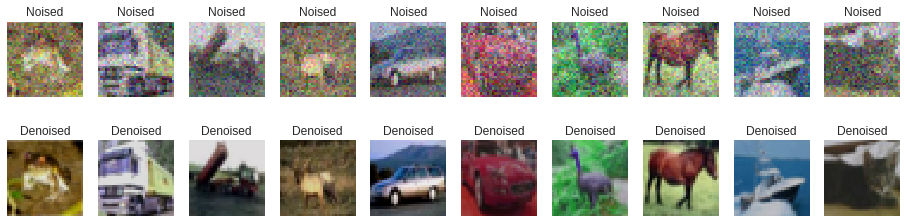

In [4]:
plt.figure(figsize = (16, 4))
for i, (image, label) in enumerate(train_cifar):
    plt.subplot(2, 10, i + 1)
    plt.imshow(image.transpose((1, 2, 0)).asnumpy())
    plt.axis('off')
    plt.title('Noised')
    plt.subplot(2, 10, i + 11)
    plt.imshow(label.transpose((1, 2, 0)).asnumpy())
    plt.axis('off')
    plt.title('Denoised')
    if i == 9:
        break

plt.show()

In [0]:
batch_size = 64
train_data = gluon.data.DataLoader(train_cifar, batch_size = batch_size, shuffle = True)
test_data = gluon.data.DataLoader(test_cifar, batch_size = batch_size, shuffle = False)
batches = len(train_data)

In [6]:
model = nn.HybridSequential()

model.add(nn.Conv2D(32, 4, 1, 1))
model.add(nn.LeakyReLU(0.2))
model.add(nn.BatchNorm())
model.add(nn.MaxPool2D())

model.add(nn.Conv2D(64, 4, 1, 1))
model.add(nn.LeakyReLU(0.2))
model.add(nn.BatchNorm())
model.add(nn.MaxPool2D())

model.add(nn.Conv2D(128, 3, 1, 1))
model.add(nn.LeakyReLU(0.2))
model.add(nn.BatchNorm())

model.add(nn.Conv2DTranspose(16, 4, 2, 1))
model.add(nn.LeakyReLU(0.2))
model.add(nn.BatchNorm())
model.add(nn.Conv2DTranspose(8, 4, 2, 1))
model.add(nn.LeakyReLU(0.2))
model.add(nn.BatchNorm())
model.add(nn.Conv2DTranspose(4, 3, 1, 0))
model.add(nn.LeakyReLU(0.2))
model.add(nn.BatchNorm())
model.add(nn.Conv2DTranspose(3, 3, 1, 0, activation = 'sigmoid'))

model.initialize(mx.init.Xavier(), ctx)
model

HybridSequential(
  (0): Conv2D(None -> 32, kernel_size=(4, 4), stride=(1, 1), padding=(1, 1))
  (1): LeakyReLU(0.2)
  (2): BatchNorm(axis=1, eps=1e-05, momentum=0.9, fix_gamma=False, use_global_stats=False, in_channels=None)
  (3): MaxPool2D(size=(2, 2), stride=(2, 2), padding=(0, 0), ceil_mode=False, global_pool=False, pool_type=max, layout=NCHW)
  (4): Conv2D(None -> 64, kernel_size=(4, 4), stride=(1, 1), padding=(1, 1))
  (5): LeakyReLU(0.2)
  (6): BatchNorm(axis=1, eps=1e-05, momentum=0.9, fix_gamma=False, use_global_stats=False, in_channels=None)
  (7): MaxPool2D(size=(2, 2), stride=(2, 2), padding=(0, 0), ceil_mode=False, global_pool=False, pool_type=max, layout=NCHW)
  (8): Conv2D(None -> 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (9): LeakyReLU(0.2)
  (10): BatchNorm(axis=1, eps=1e-05, momentum=0.9, fix_gamma=False, use_global_stats=False, in_channels=None)
  (11): Conv2DTranspose(16 -> 0, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
  (12): LeakyReLU(0.2)

In [7]:
model.summary(image.expand_dims(0).as_in_context(ctx))

--------------------------------------------------------------------------------
        Layer (type)                                Output Shape         Param #
               Input                              (1, 3, 32, 32)               0
            Conv2D-1                             (1, 32, 31, 31)            1568
         LeakyReLU-2                             (1, 32, 31, 31)               0
         BatchNorm-3                             (1, 32, 31, 31)             128
         MaxPool2D-4                             (1, 32, 15, 15)               0
            Conv2D-5                             (1, 64, 14, 14)           32832
         LeakyReLU-6                             (1, 64, 14, 14)               0
         BatchNorm-7                             (1, 64, 14, 14)             256
         MaxPool2D-8                               (1, 64, 7, 7)               0
            Conv2D-9                              (1, 128, 7, 7)           73856
        LeakyReLU-10        

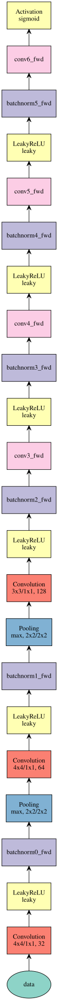

In [8]:
plot = mx.viz.plot_network(model(mx.sym.var(name = 'data')), node_attrs={"fixedsize":"false"})
plot

In [0]:
model.hybridize()
objective = gluon.loss.SigmoidBinaryCrossEntropyLoss(from_sigmoid = True)
trainer = gluon.Trainer(model.collect_params(), 'adam', {'learning_rate': 0.002})
test_iter = iter(test_data)


Epoch: 1 | Loss: 0.58688


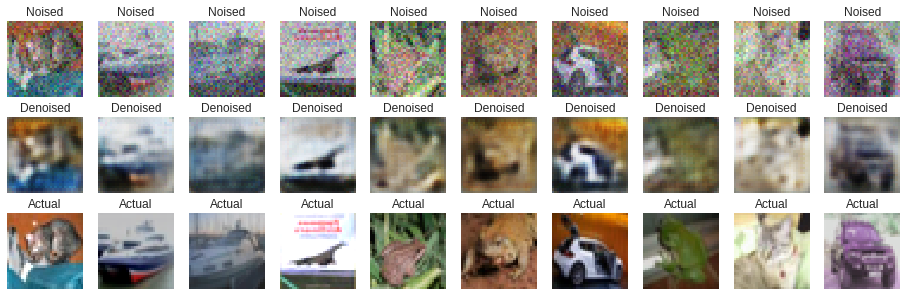


Epoch: 2 | Loss: 0.57420


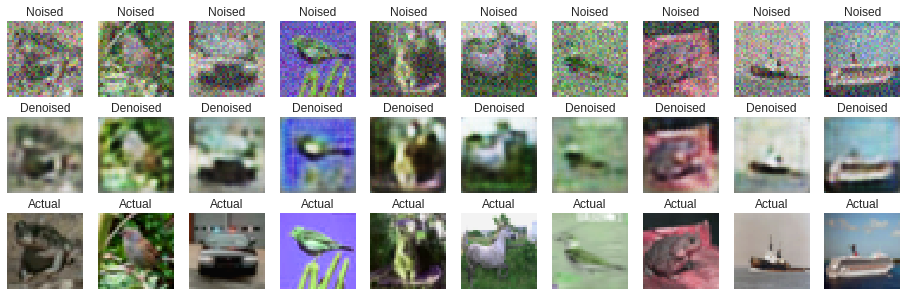


Epoch: 3 | Loss: 0.57133


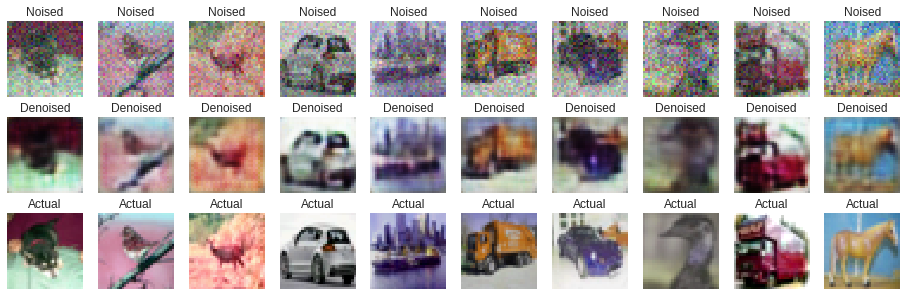


Epoch: 4 | Loss: 0.57035


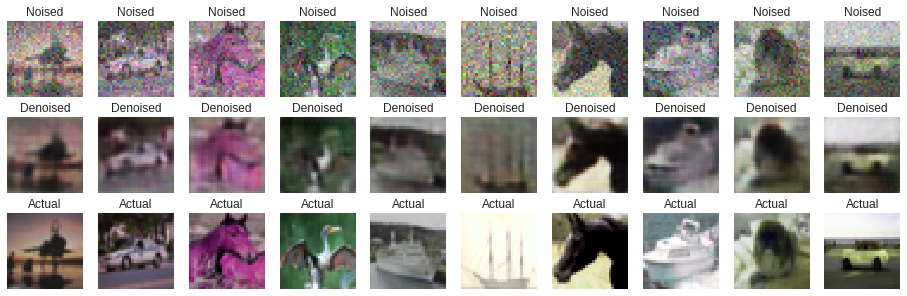


Epoch: 5 | Loss: 0.56998


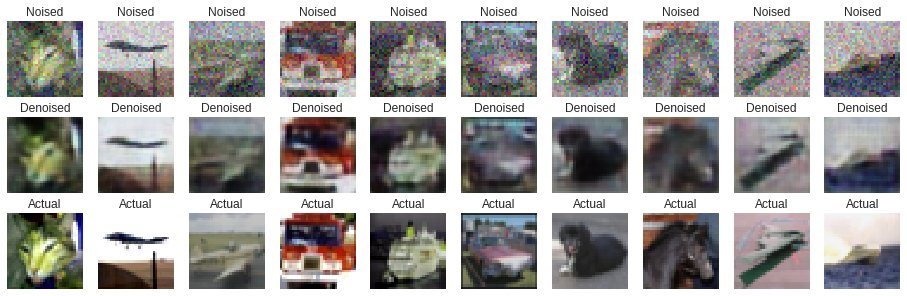


Epoch: 6 | Loss: 0.56944


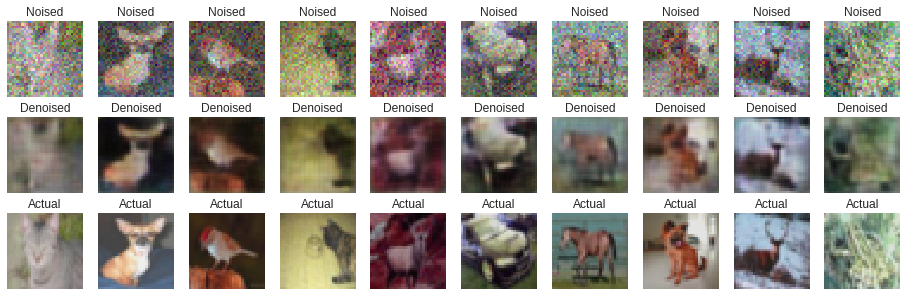


Epoch: 7 | Loss: 0.56926


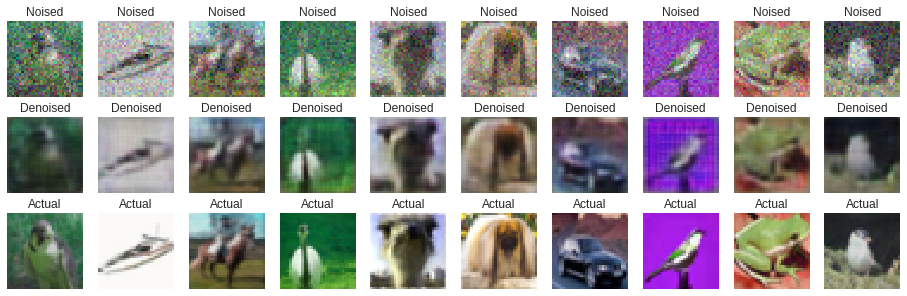


Epoch: 8 | Loss: 0.56909


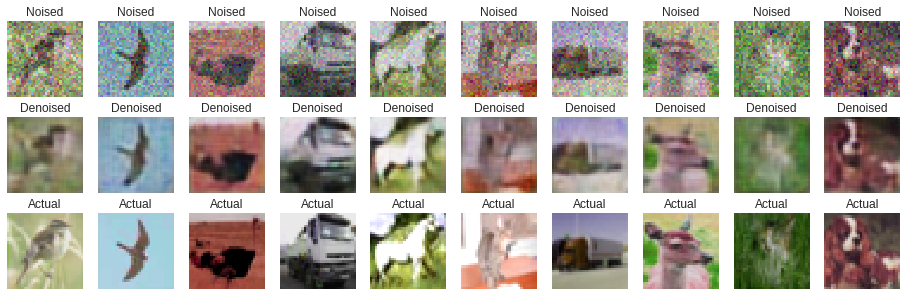


Epoch: 9 | Loss: 0.56842


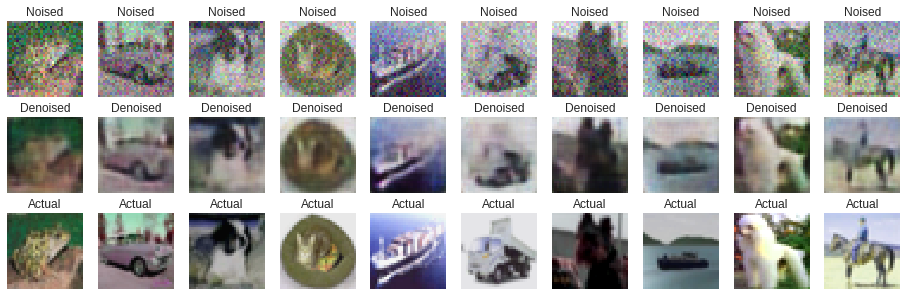


Epoch: 10 | Loss: 0.56845


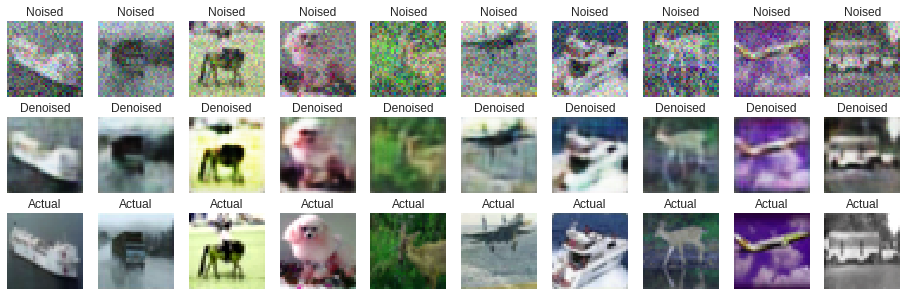


Epoch: 11 | Loss: 0.56781


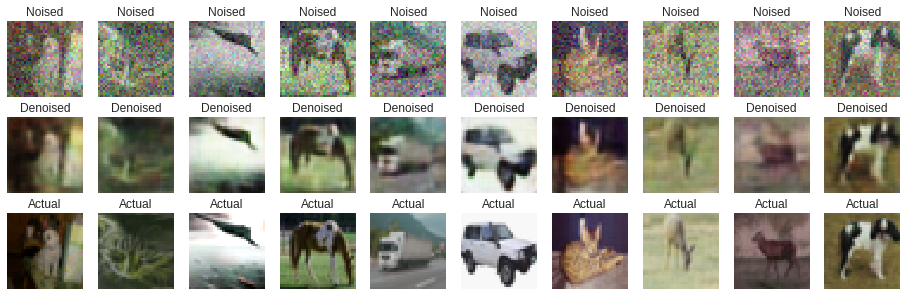


Epoch: 12 | Loss: 0.56762


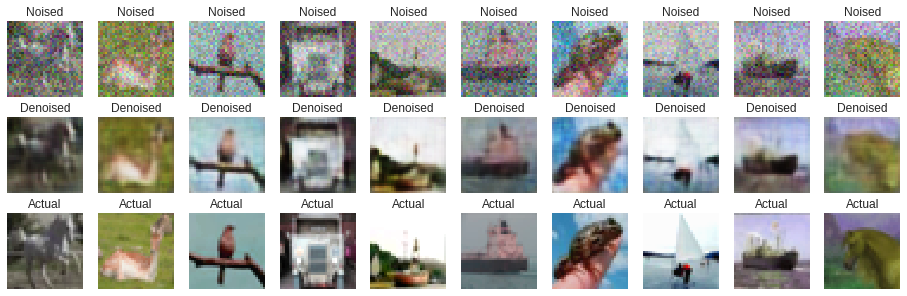


Epoch: 13 | Loss: 0.56788


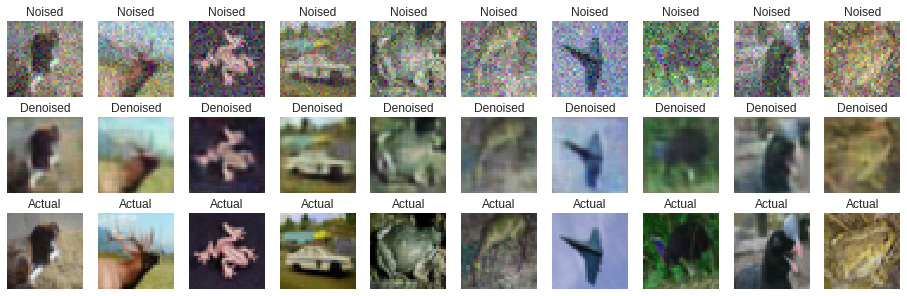


Epoch: 14 | Loss: 0.56723


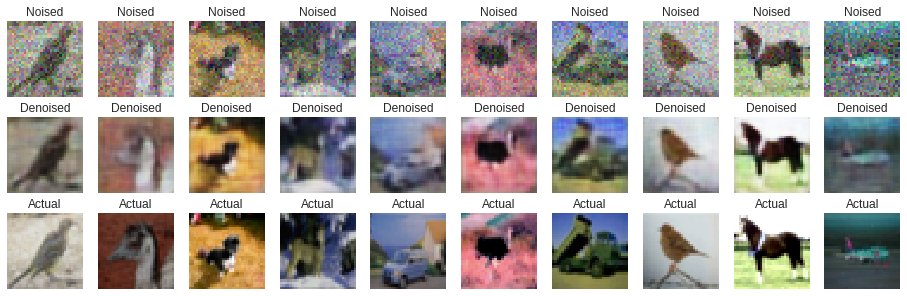


Epoch: 15 | Loss: 0.56713


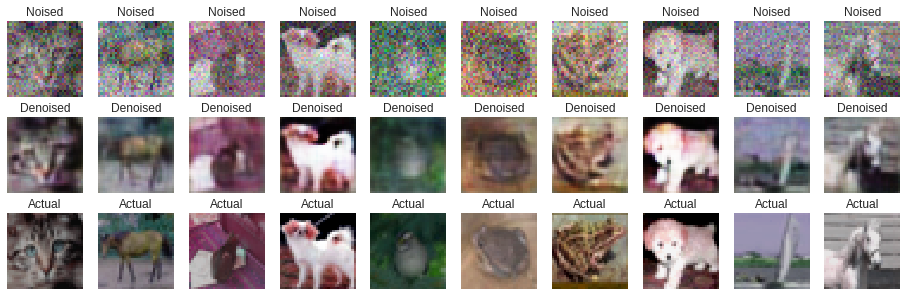


Epoch: 16 | Loss: 0.56717


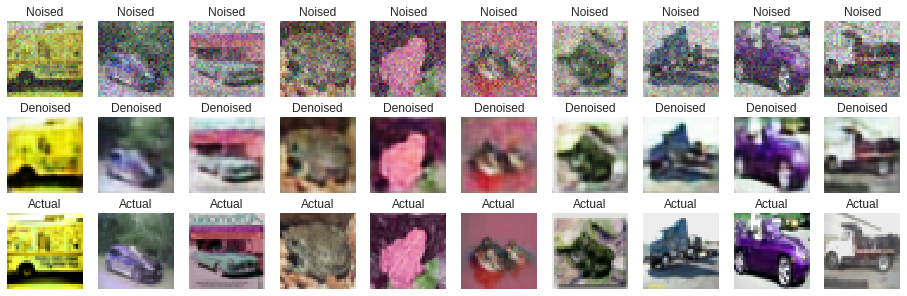


Epoch: 17 | Loss: 0.56685


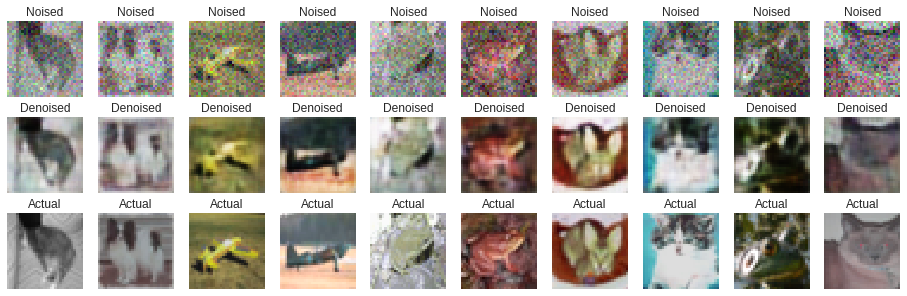


Epoch: 18 | Loss: 0.56677


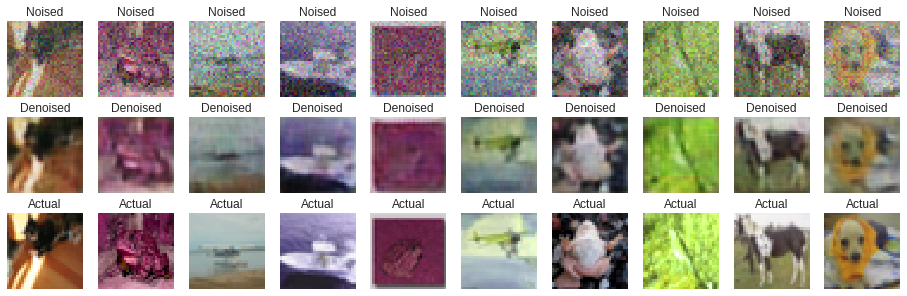


Epoch: 19 | Loss: 0.56661


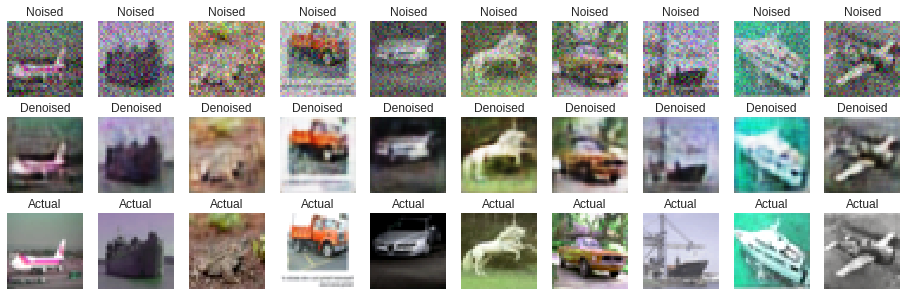


Epoch: 20 | Loss: 0.56674


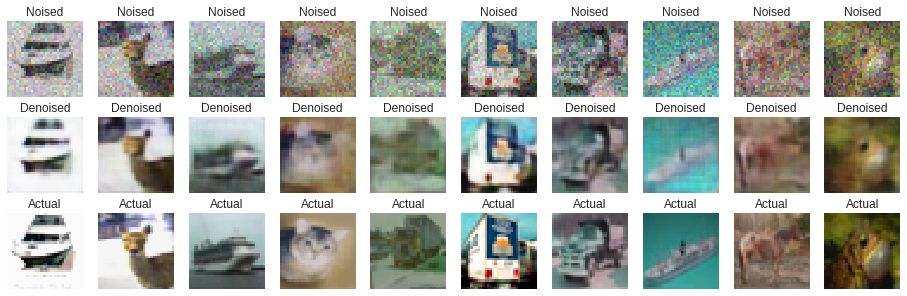


Epoch: 21 | Loss: 0.56667


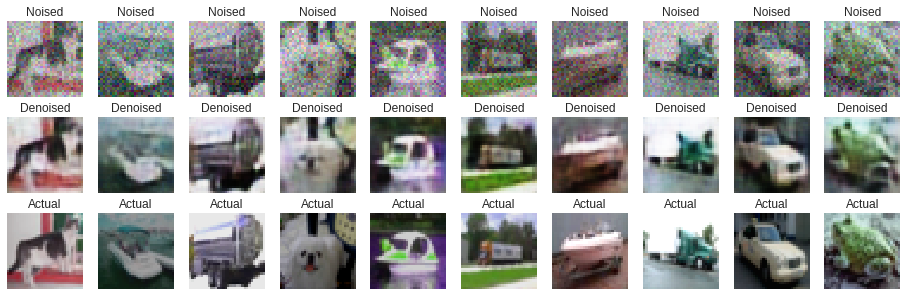


Epoch: 22 | Loss: 0.56663


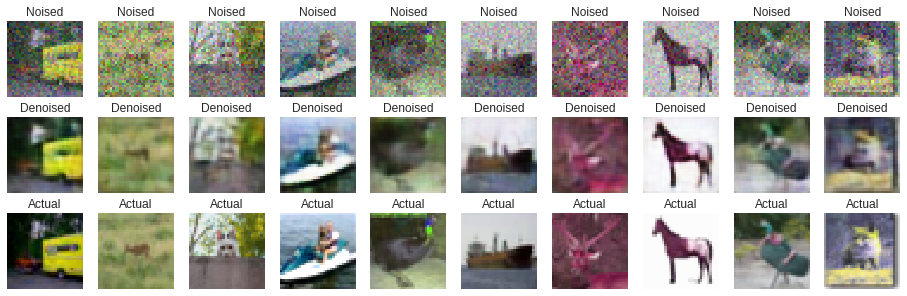


Epoch: 23 | Loss: 0.56630


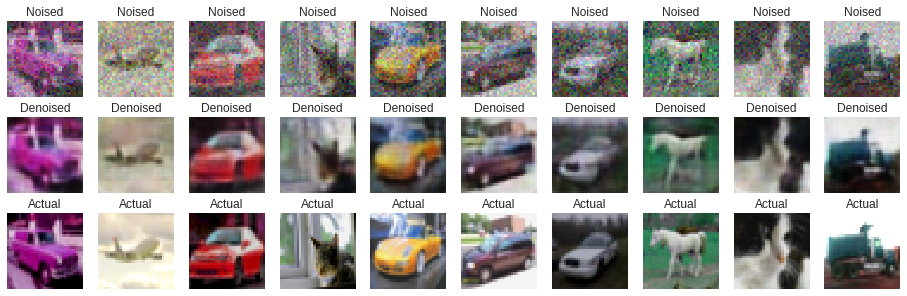


Epoch: 24 | Loss: 0.56658


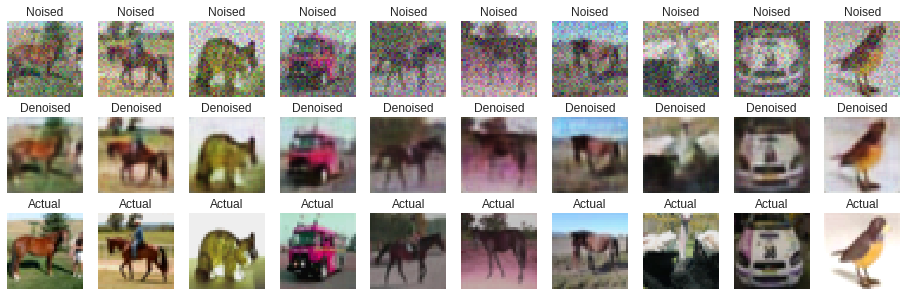


Epoch: 25 | Loss: 0.56628


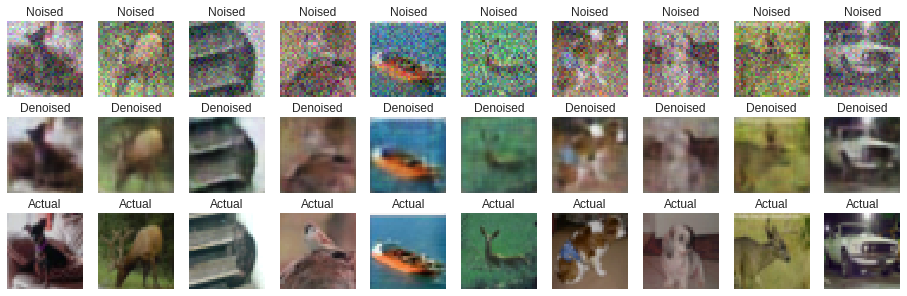


Epoch: 26 | Loss: 0.56612


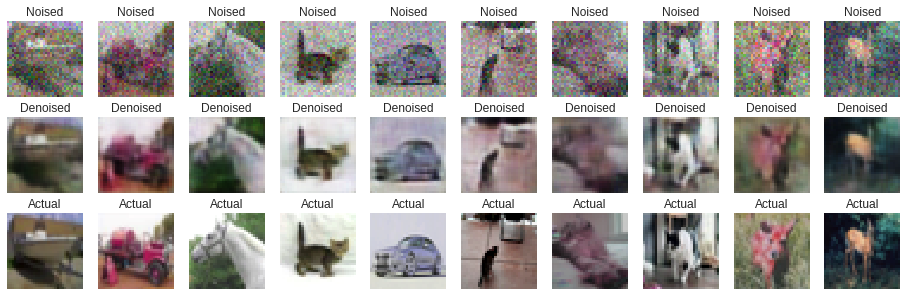


Epoch: 27 | Loss: 0.56608


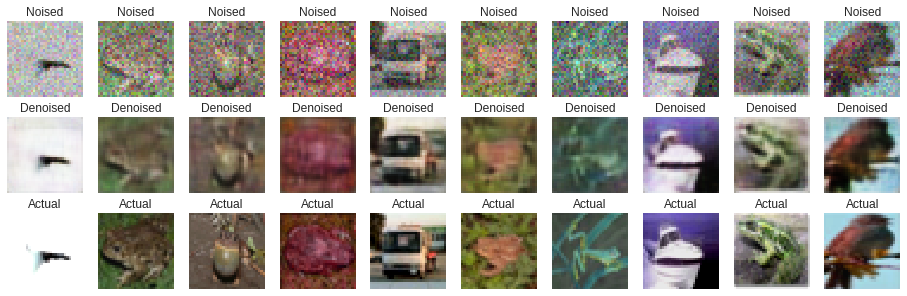


Epoch: 28 | Loss: 0.56639


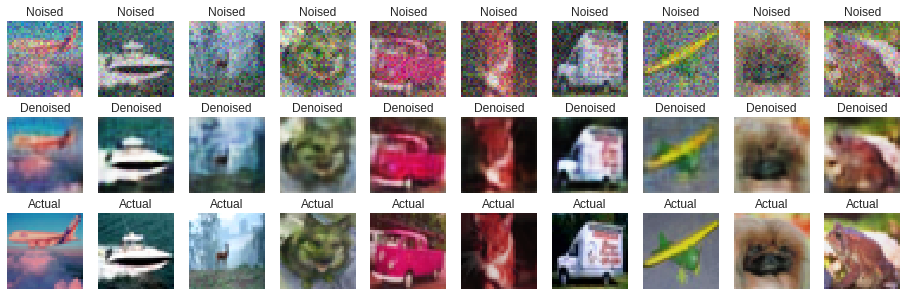


Epoch: 29 | Loss: 0.56589


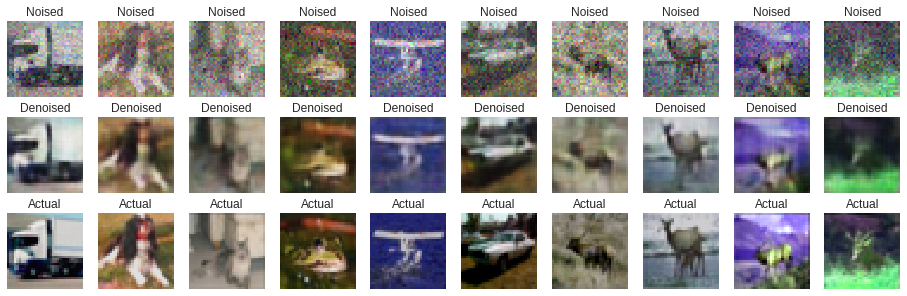


Epoch: 30 | Loss: 0.56603


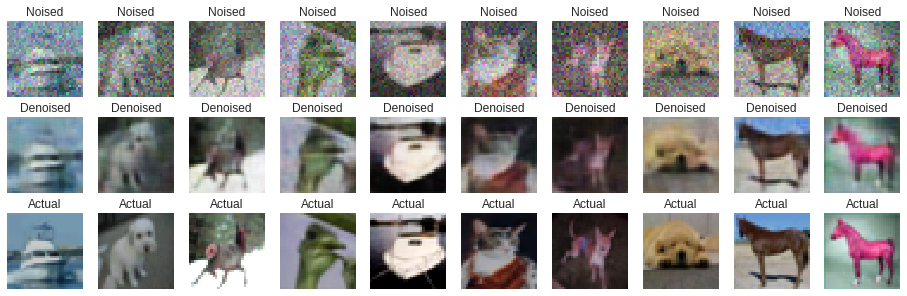


Epoch: 31 | Loss: 0.56599


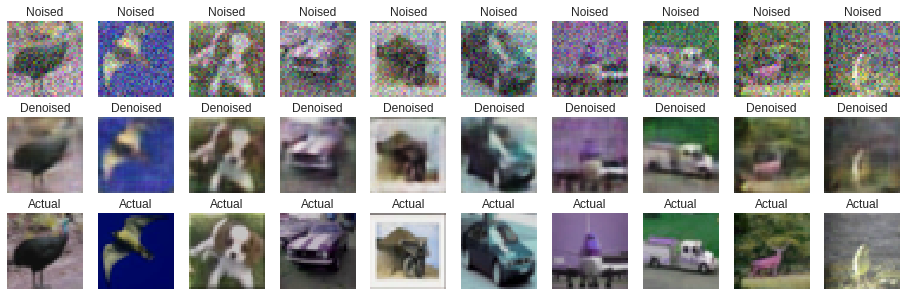


Epoch: 32 | Loss: 0.56572


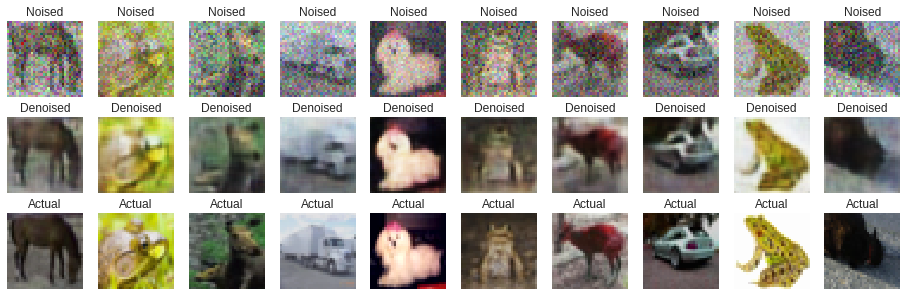


Epoch: 33 | Loss: 0.56595


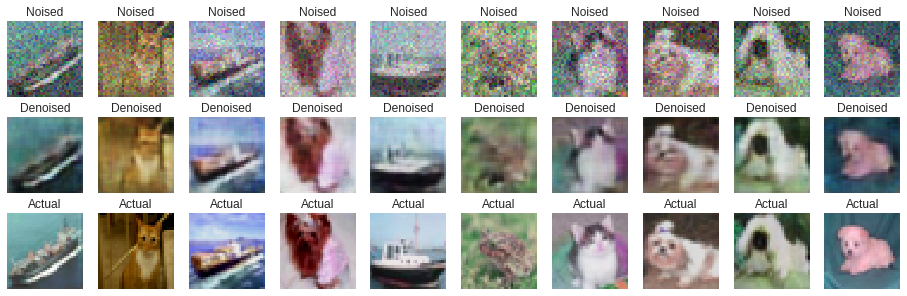


Epoch: 34 | Loss: 0.56617


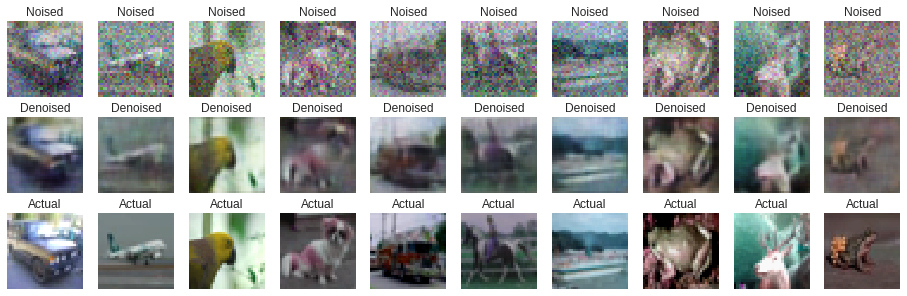


Epoch: 35 | Loss: 0.56585


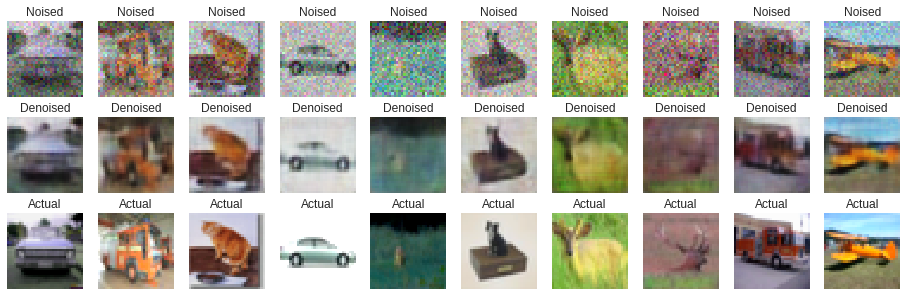


Epoch: 36 | Loss: 0.56587


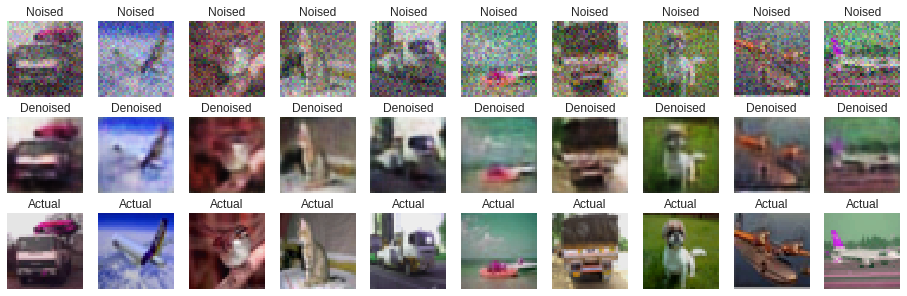


Epoch: 37 | Loss: 0.56580


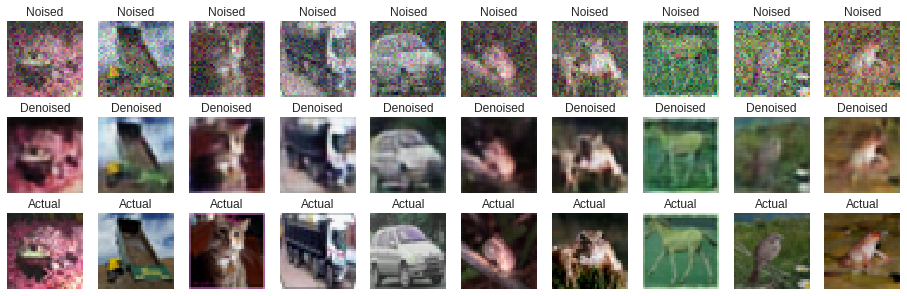


Epoch: 38 | Loss: 0.56569


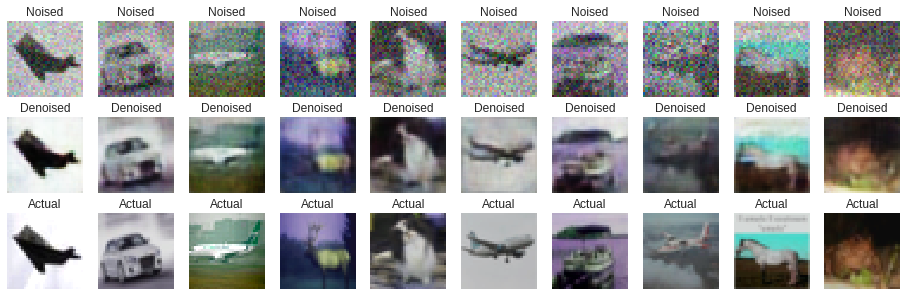


Epoch: 39 | Loss: 0.56596


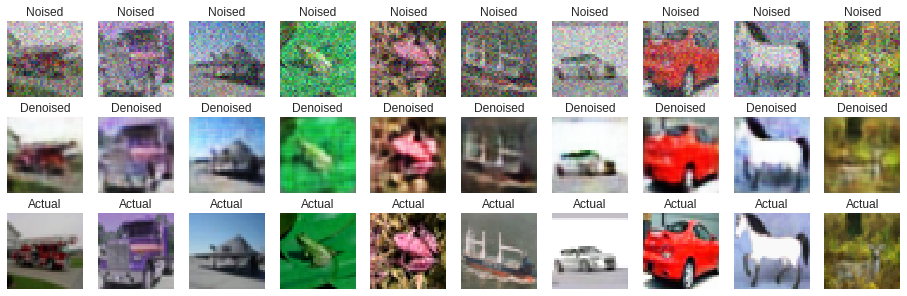


Epoch: 40 | Loss: 0.56559


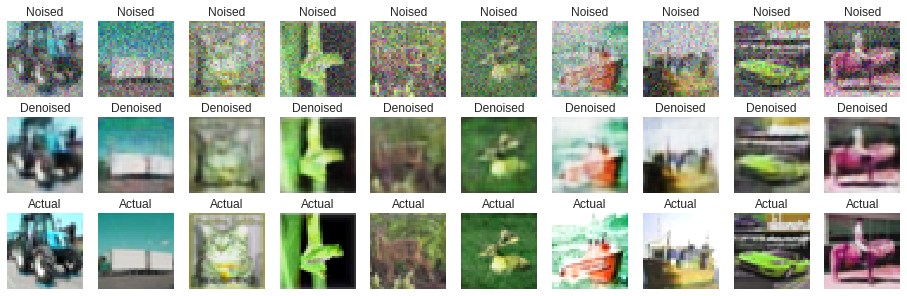


Epoch: 41 | Loss: 0.56557


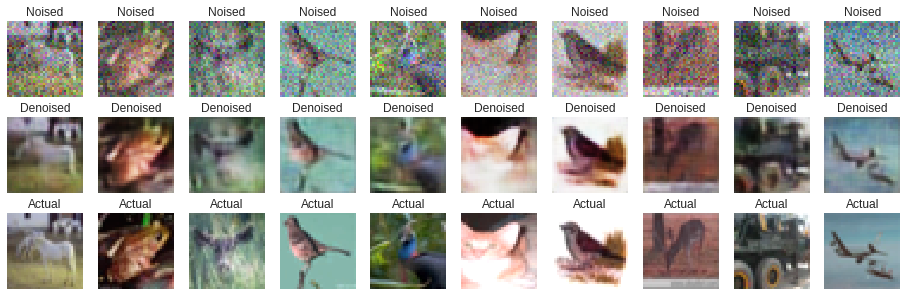


Epoch: 42 | Loss: 0.56580


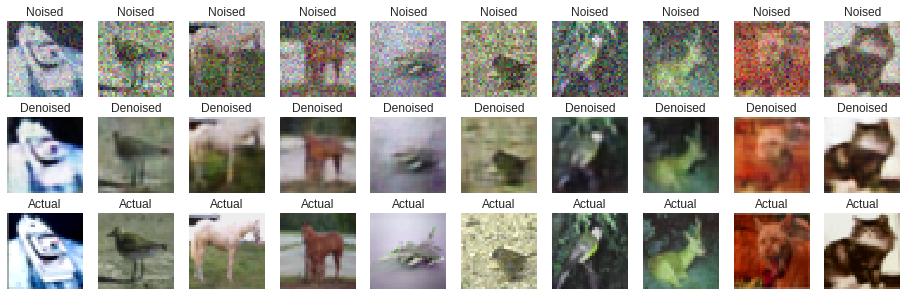


Epoch: 43 | Loss: 0.56568


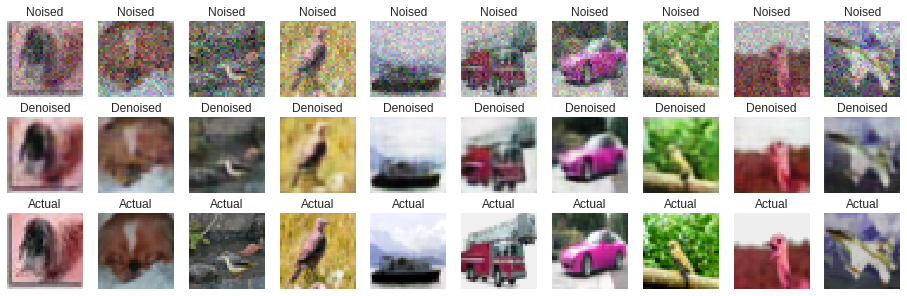


Epoch: 44 | Loss: 0.56569


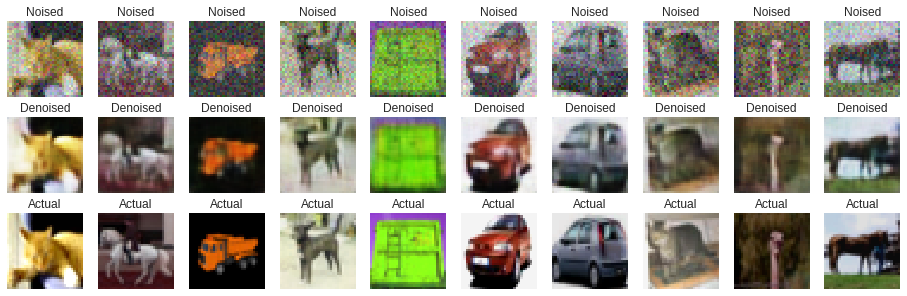


Epoch: 45 | Loss: 0.56546


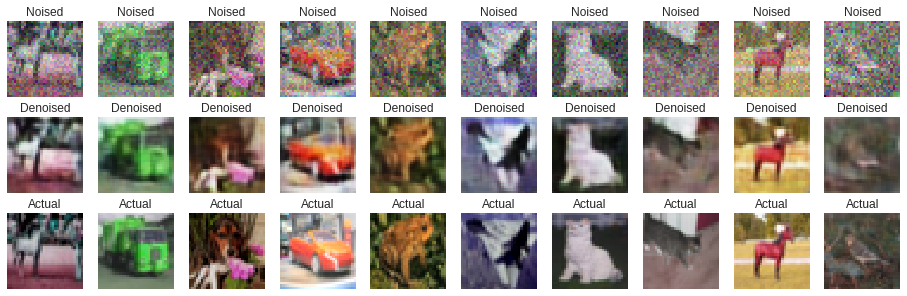


Epoch: 46 | Loss: 0.56489


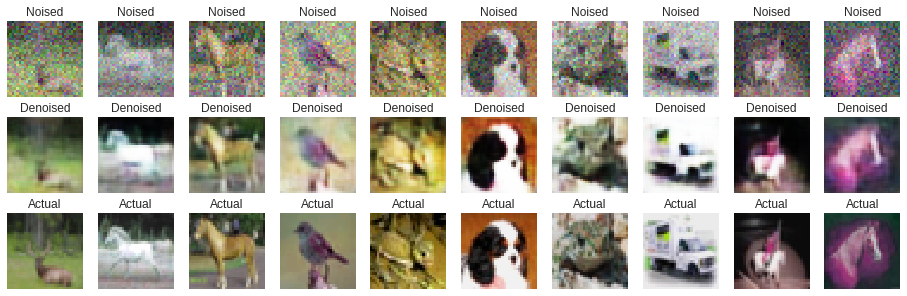


Epoch: 47 | Loss: 0.56520


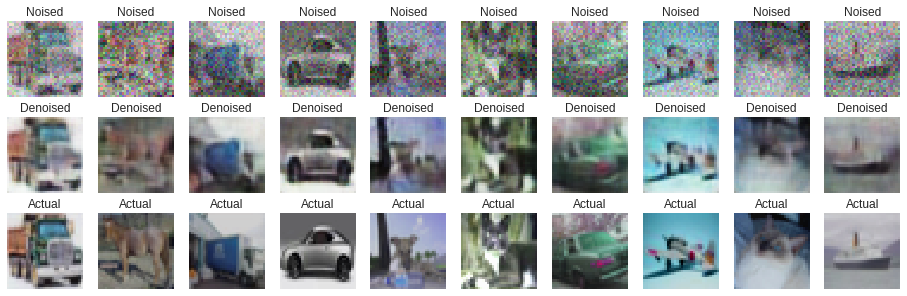


Epoch: 48 | Loss: 0.56550


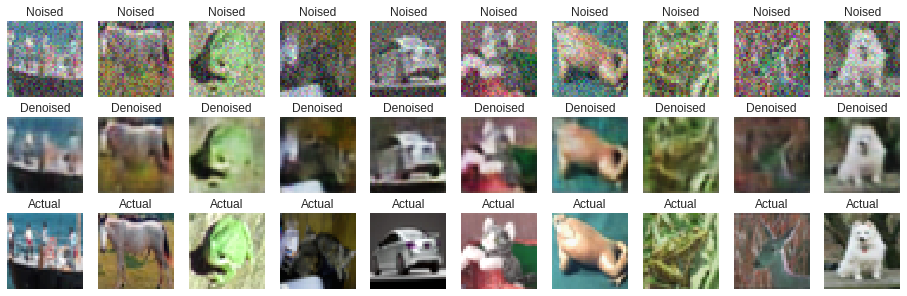


Epoch: 49 | Loss: 0.56562


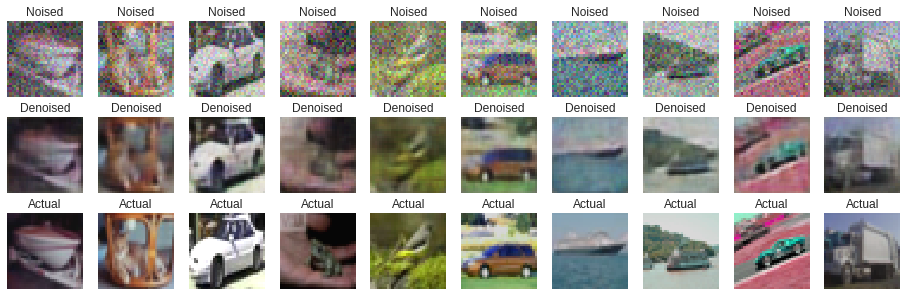


Epoch: 50 | Loss: 0.56533


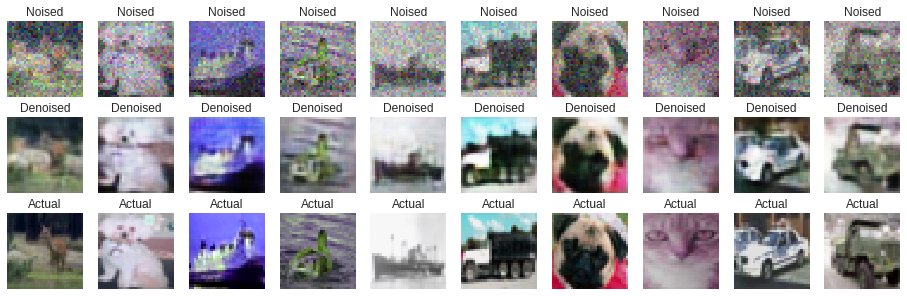


Epoch: 51 | Loss: 0.56540


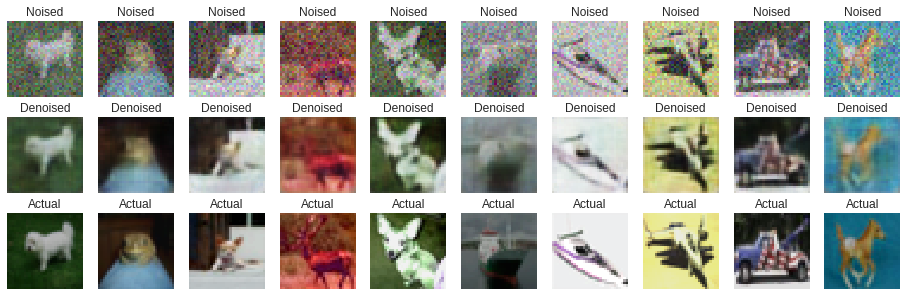


Epoch: 52 | Loss: 0.56541


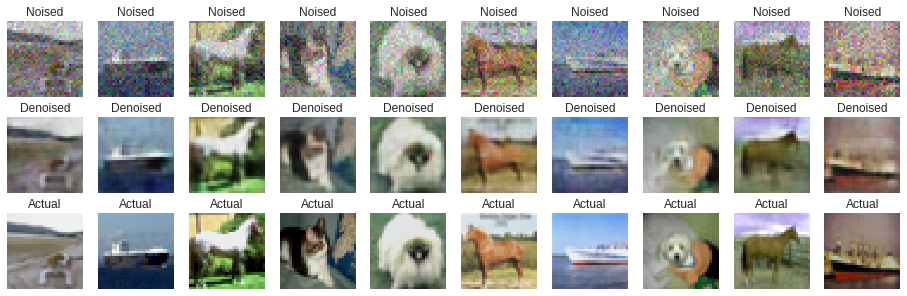


Epoch: 53 | Loss: 0.56549


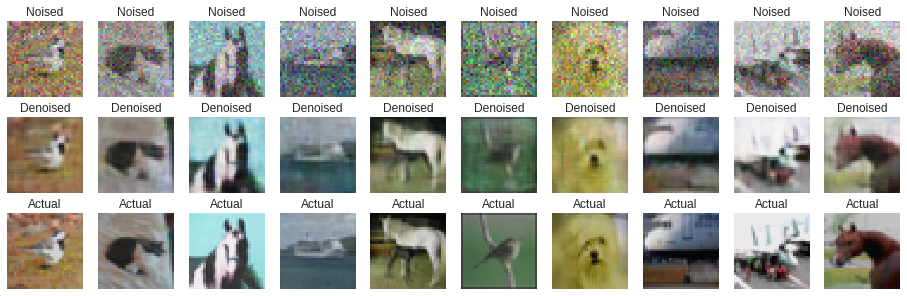


Epoch: 54 | Loss: 0.56533


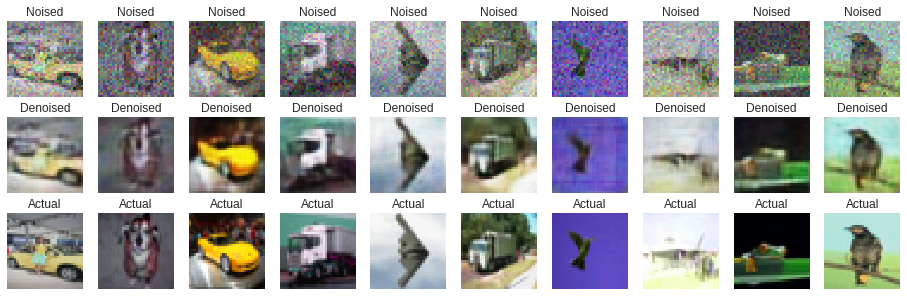


Epoch: 55 | Loss: 0.56562


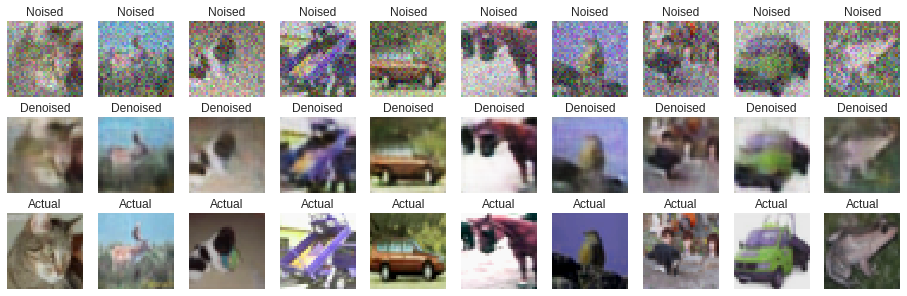


Epoch: 56 | Loss: 0.56573


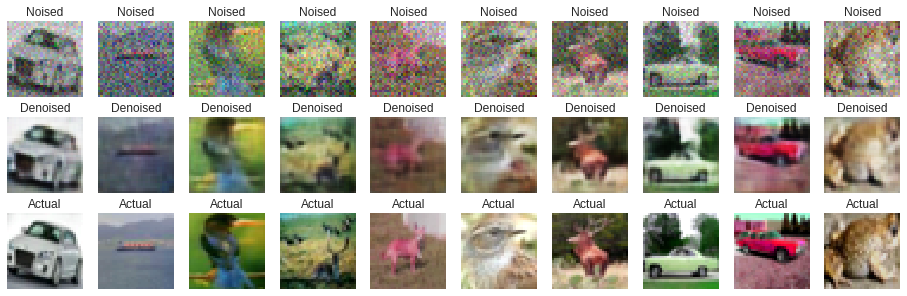


Epoch: 57 | Loss: 0.56521


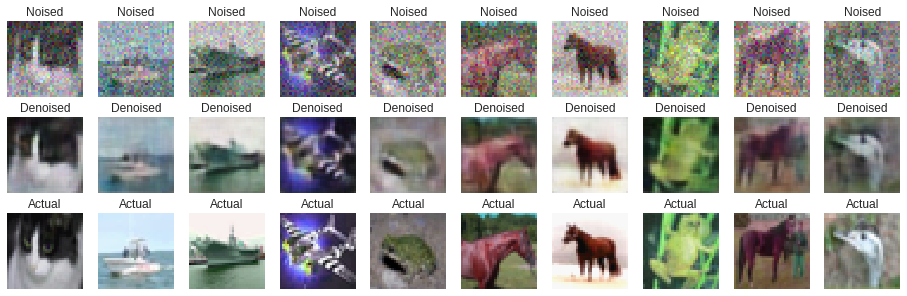


Epoch: 58 | Loss: 0.56558


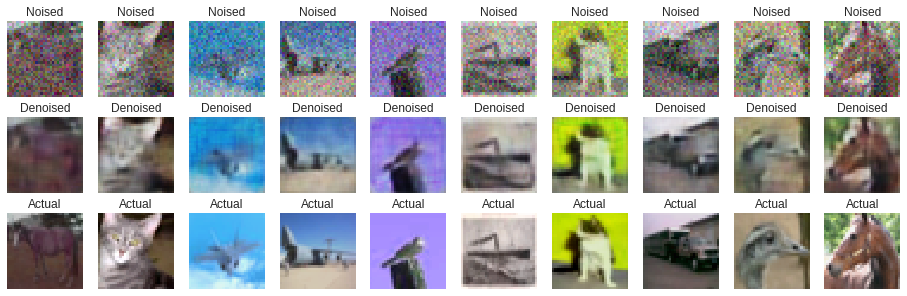


Epoch: 59 | Loss: 0.56556


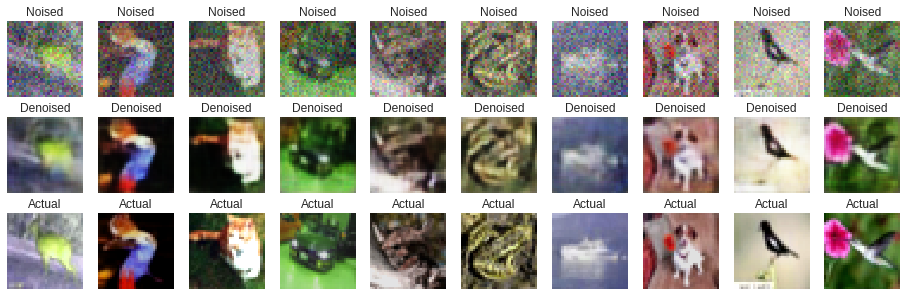


Epoch: 60 | Loss: 0.56525


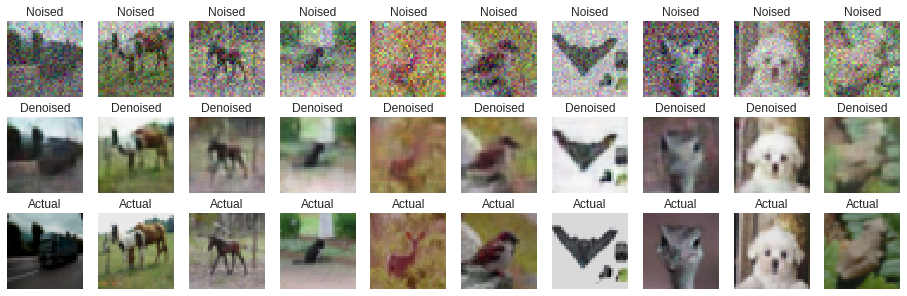


Epoch: 61 | Loss: 0.56490


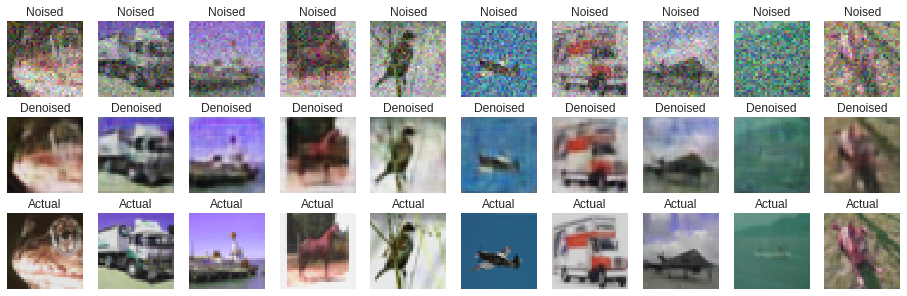


Epoch: 62 | Loss: 0.56530


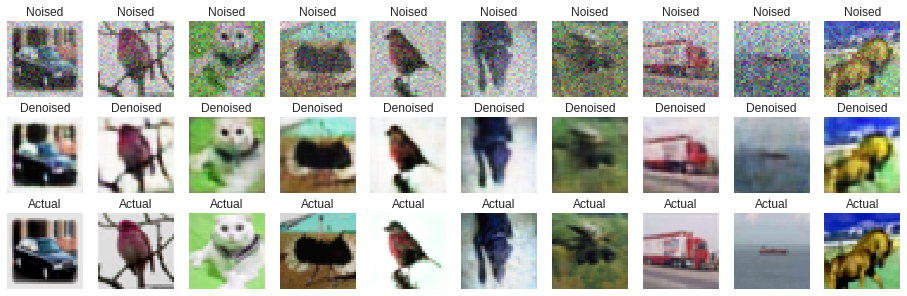


Epoch: 63 | Loss: 0.56510


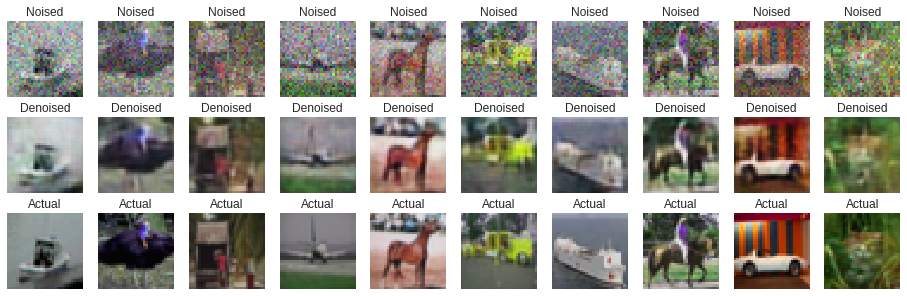


Epoch: 64 | Loss: 0.56525


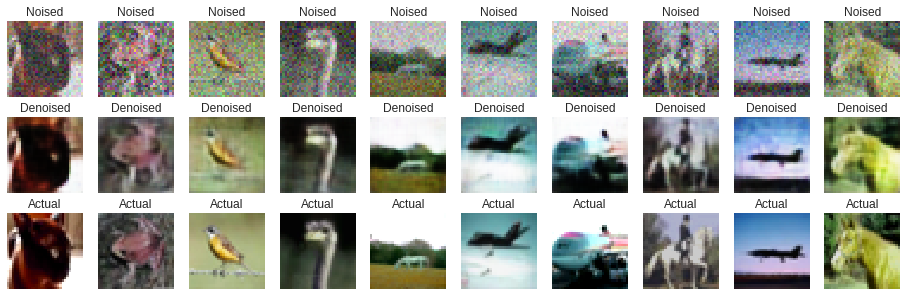


Epoch: 65 | Loss: 0.56508


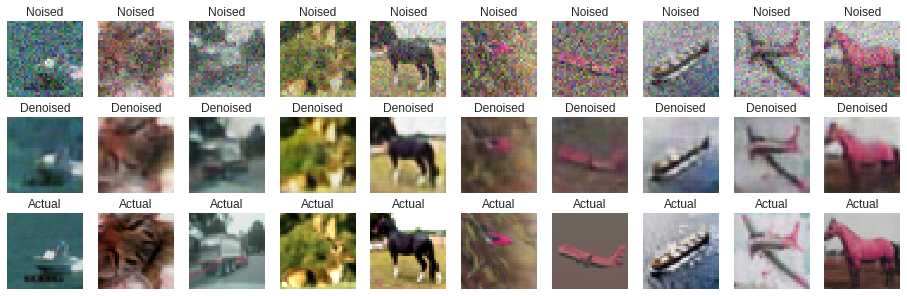


Epoch: 66 | Loss: 0.56480


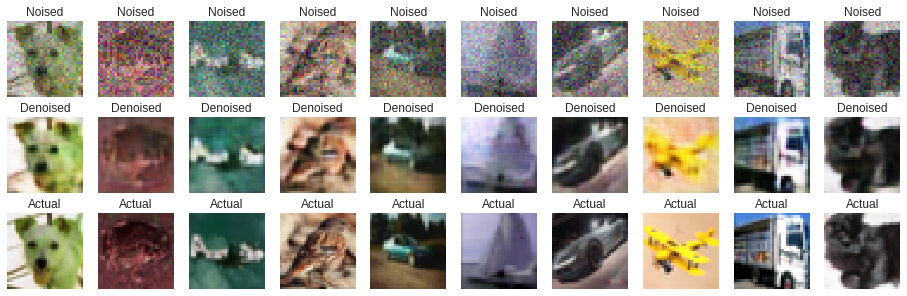


Epoch: 67 | Loss: 0.56543


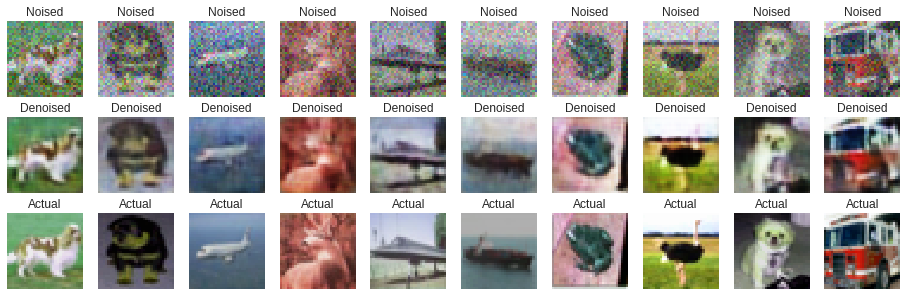


Epoch: 68 | Loss: 0.56512


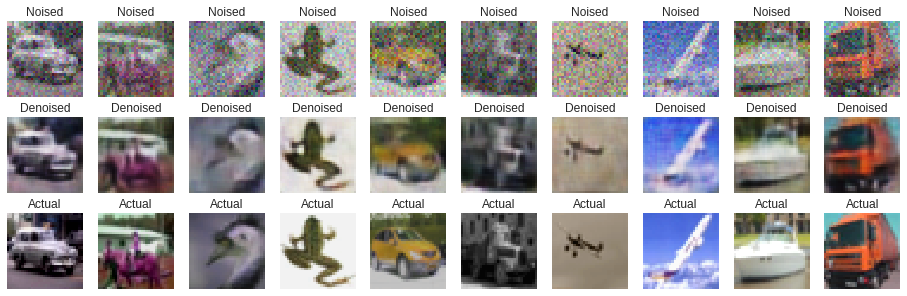


Epoch: 69 | Loss: 0.56503


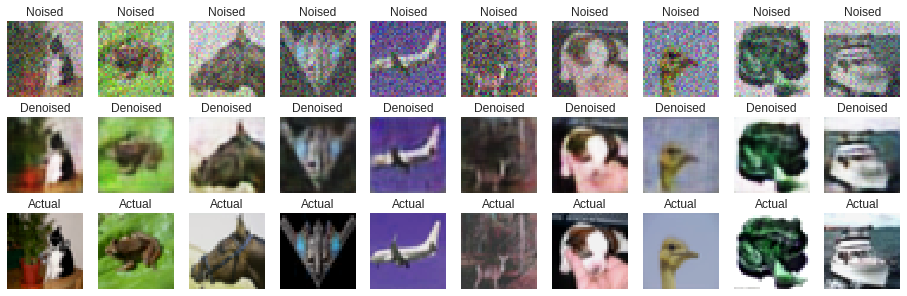


Epoch: 70 | Loss: 0.56486


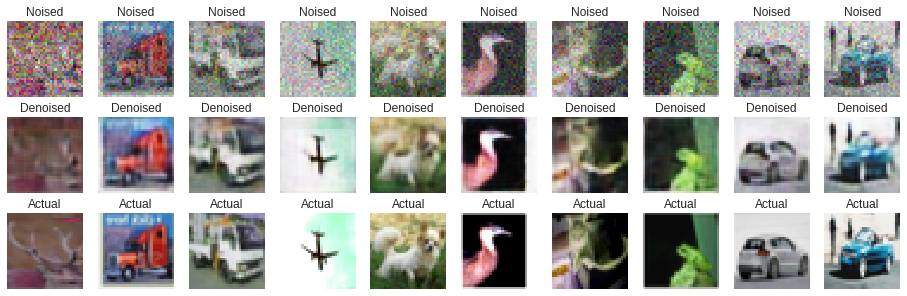


Epoch: 71 | Loss: 0.56471


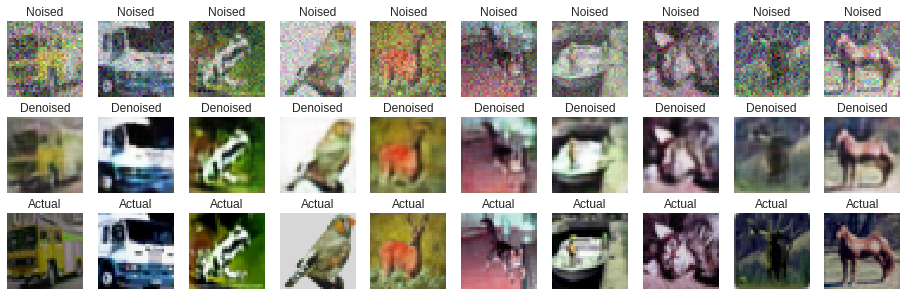


Epoch: 72 | Loss: 0.56488


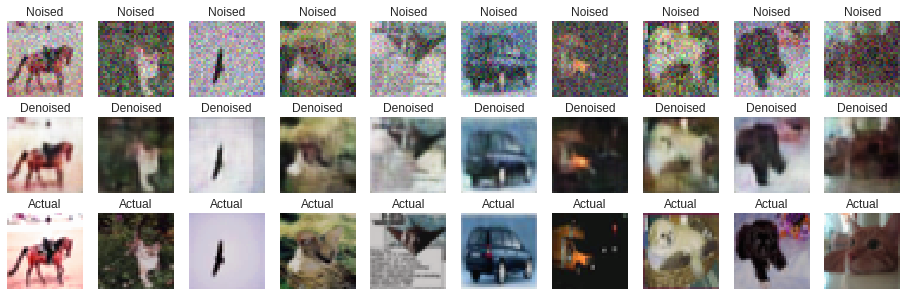


Epoch: 73 | Loss: 0.56498


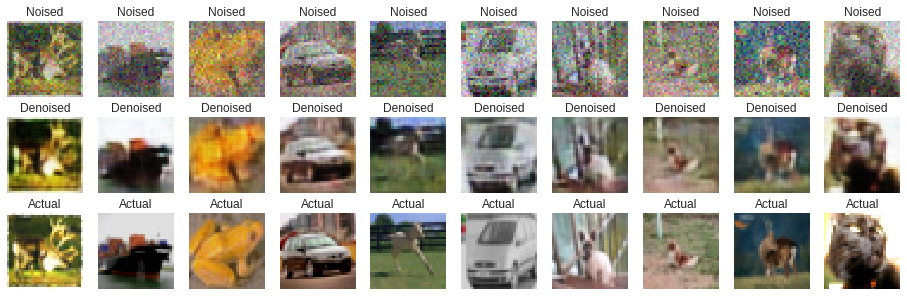


Epoch: 74 | Loss: 0.56495


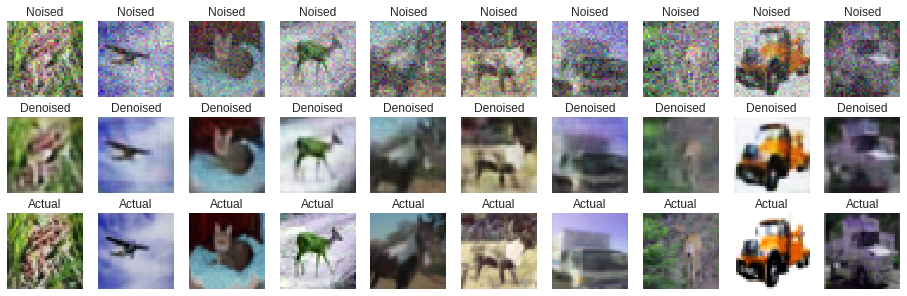


Epoch: 75 | Loss: 0.56532


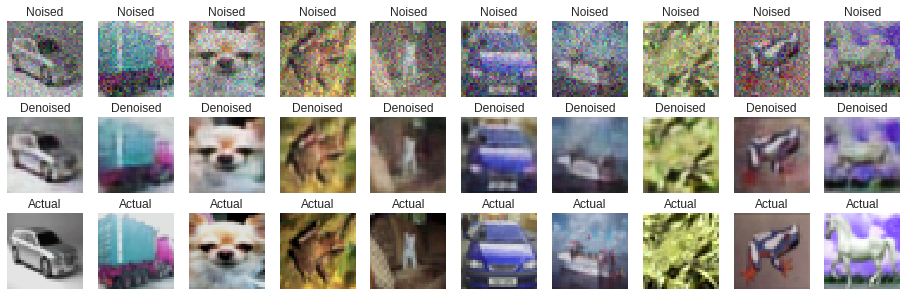


Epoch: 76 | Loss: 0.56518


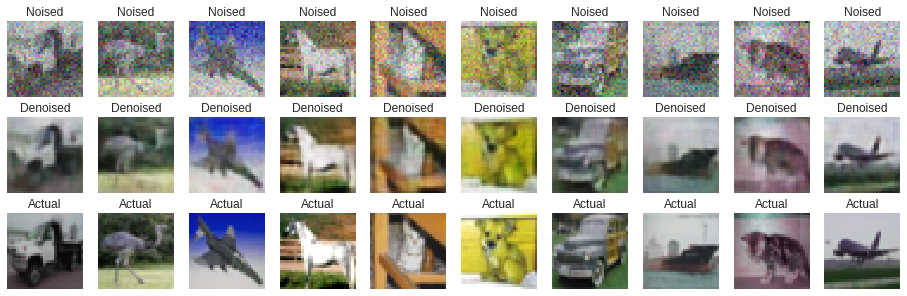


Epoch: 77 | Loss: 0.56522


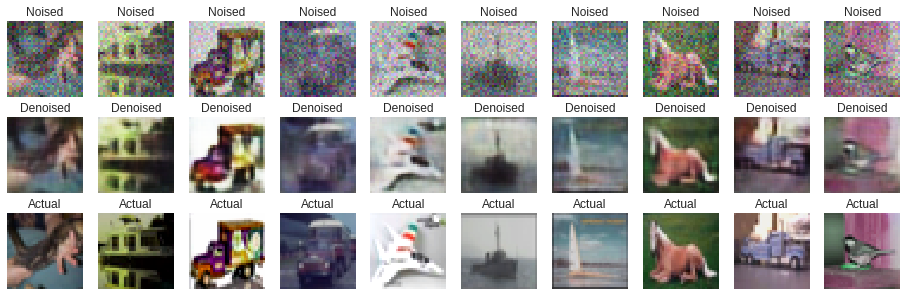


Epoch: 78 | Loss: 0.56519


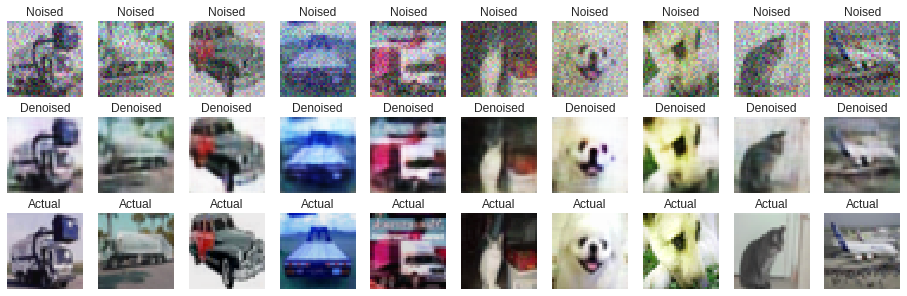


Epoch: 79 | Loss: 0.56492


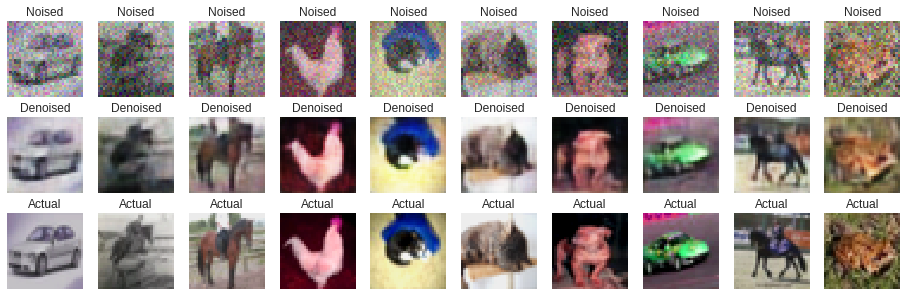


Epoch: 80 | Loss: 0.56455


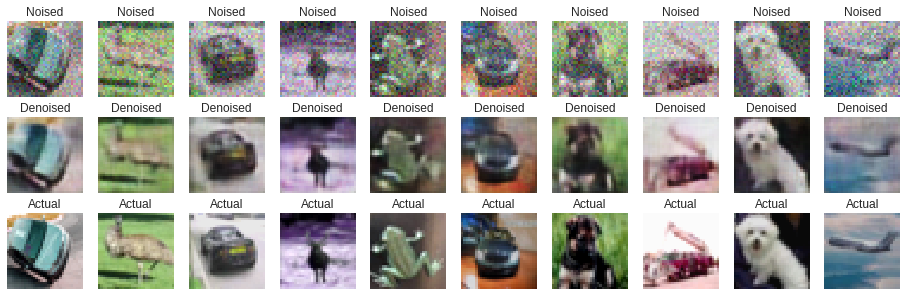


Epoch: 81 | Loss: 0.56492


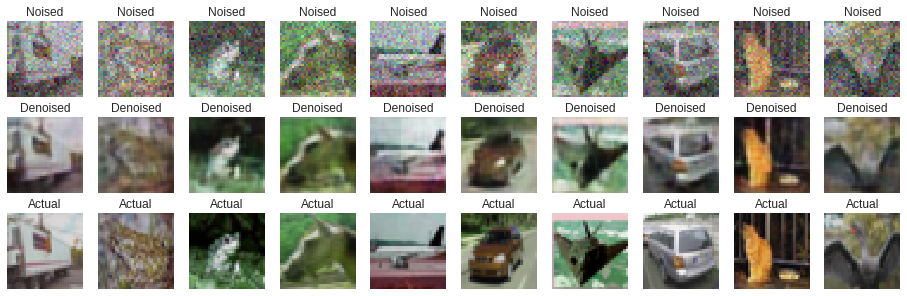


Epoch: 82 | Loss: 0.56479


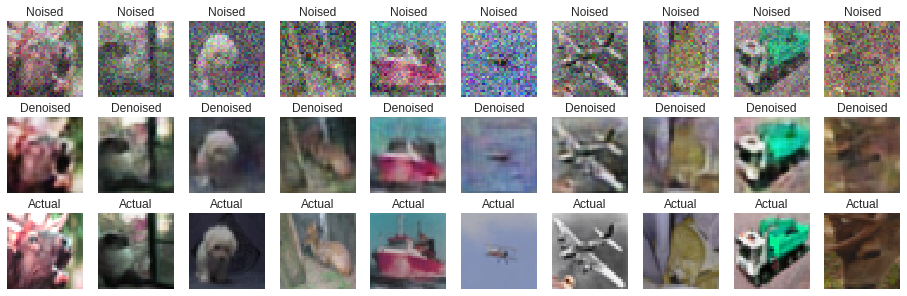


Epoch: 83 | Loss: 0.56480


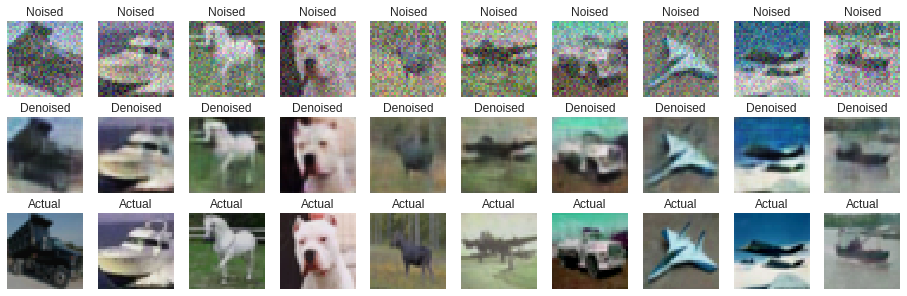


Epoch: 84 | Loss: 0.56487


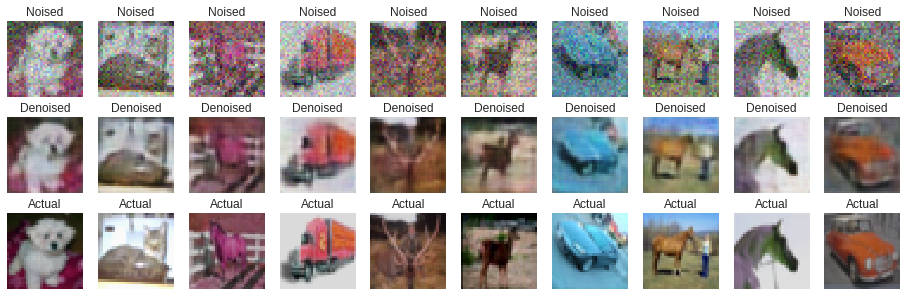


Epoch: 85 | Loss: 0.56504


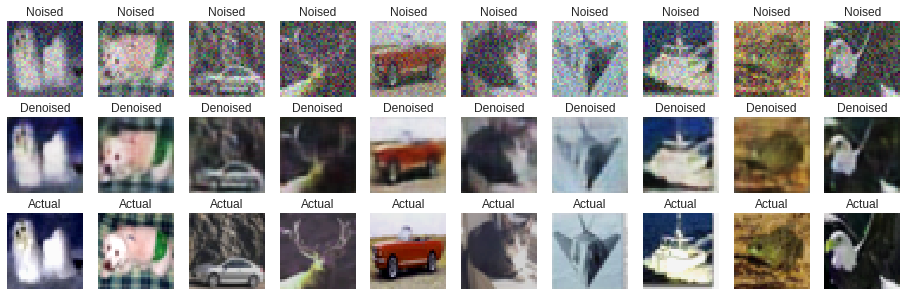


Epoch: 86 | Loss: 0.56489


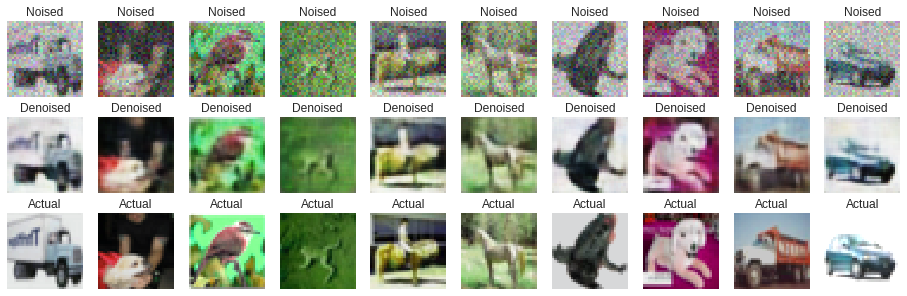


Epoch: 87 | Loss: 0.56486


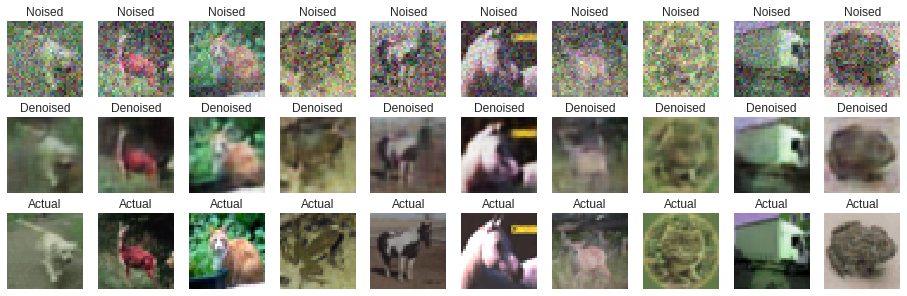


Epoch: 88 | Loss: 0.56459


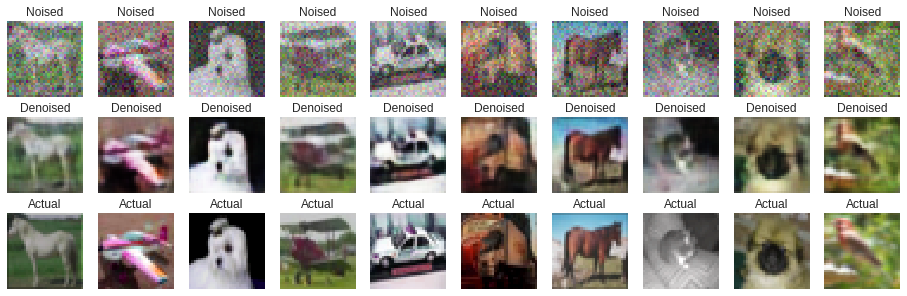


Epoch: 89 | Loss: 0.56512


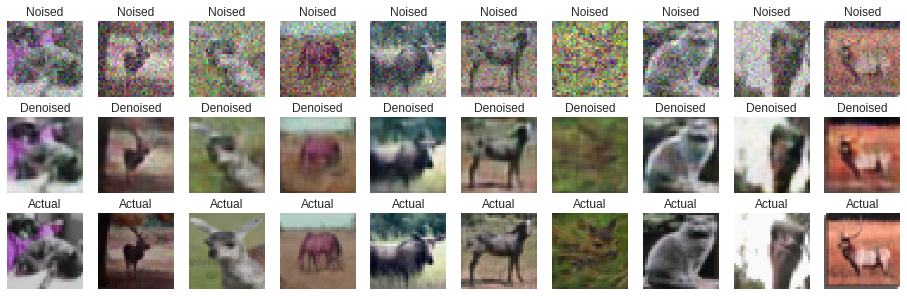


Epoch: 90 | Loss: 0.56496


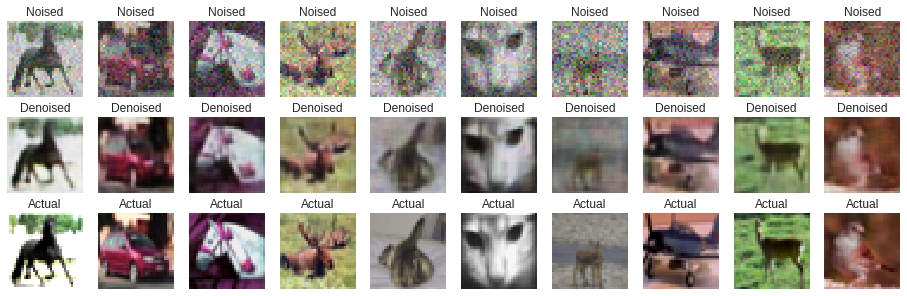


Epoch: 91 | Loss: 0.56489


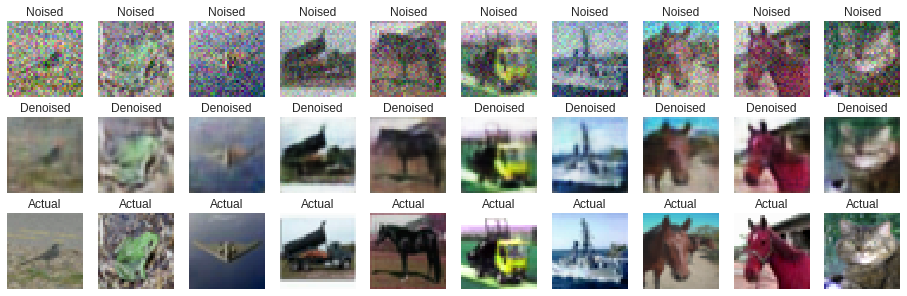


Epoch: 92 | Loss: 0.56474


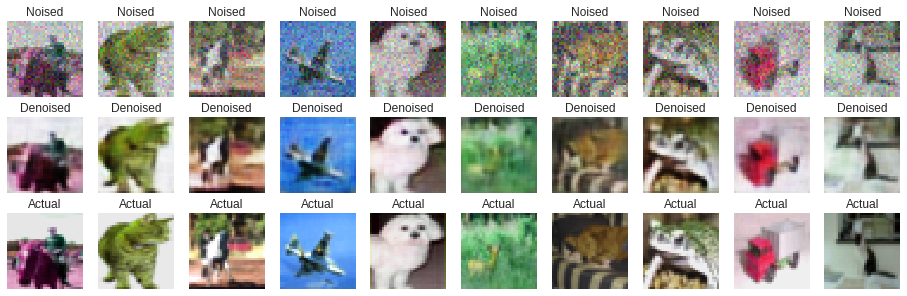


Epoch: 93 | Loss: 0.56487


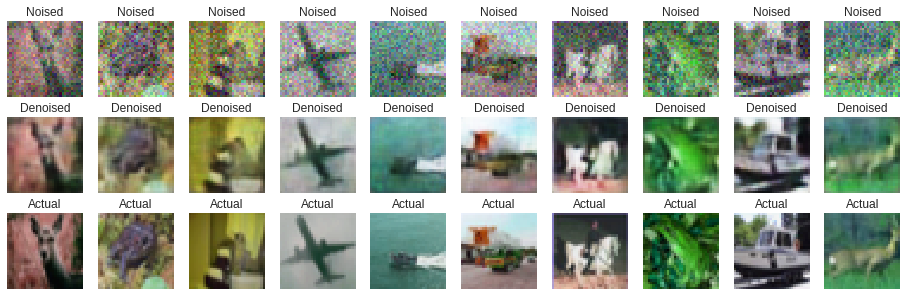


Epoch: 94 | Loss: 0.56513


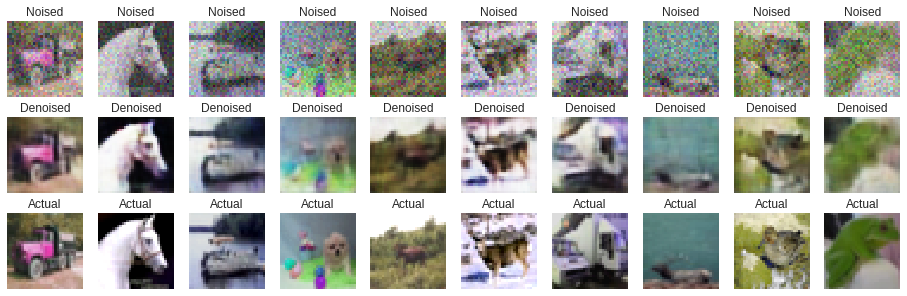


Epoch: 95 | Loss: 0.56495


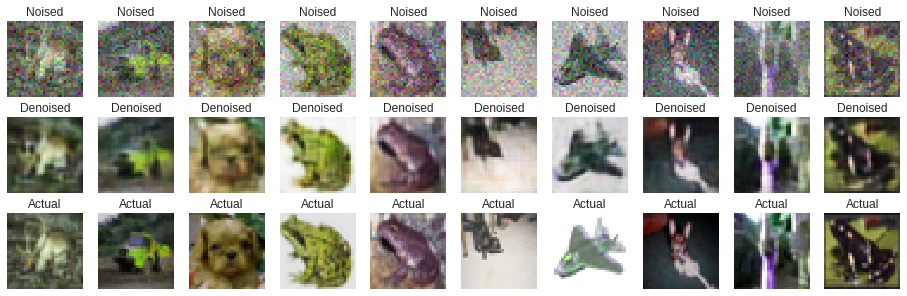


Epoch: 96 | Loss: 0.56504


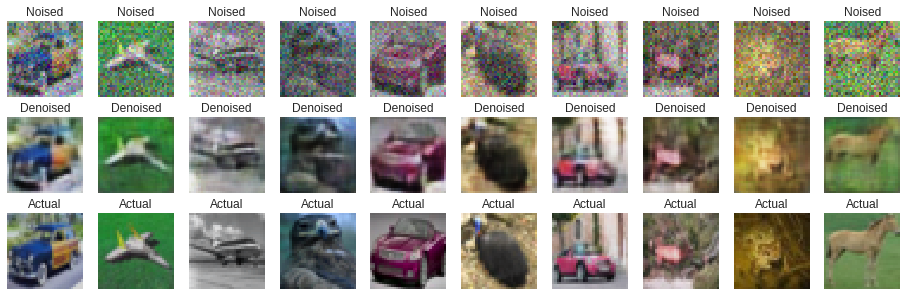


Epoch: 97 | Loss: 0.56444


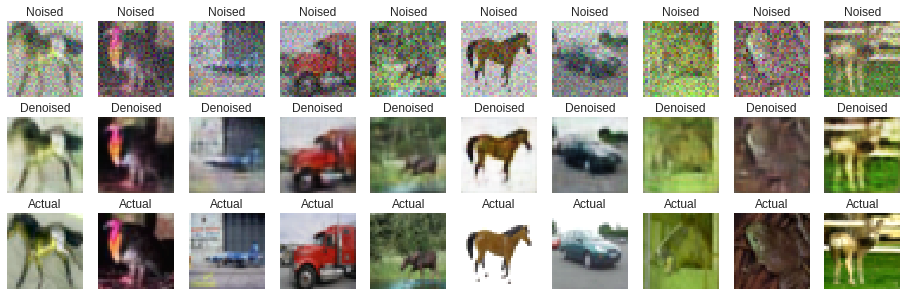


Epoch: 98 | Loss: 0.56475


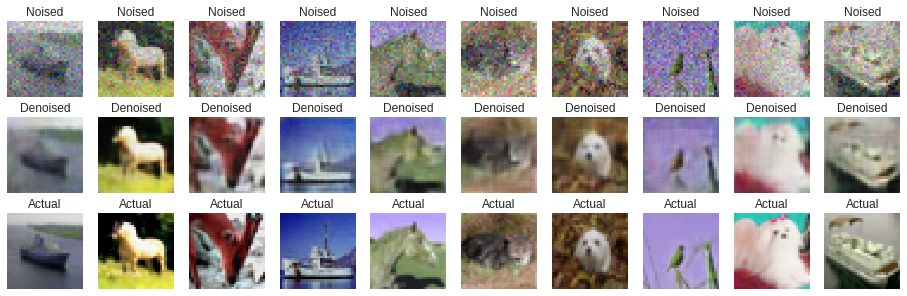


Epoch: 99 | Loss: 0.56497


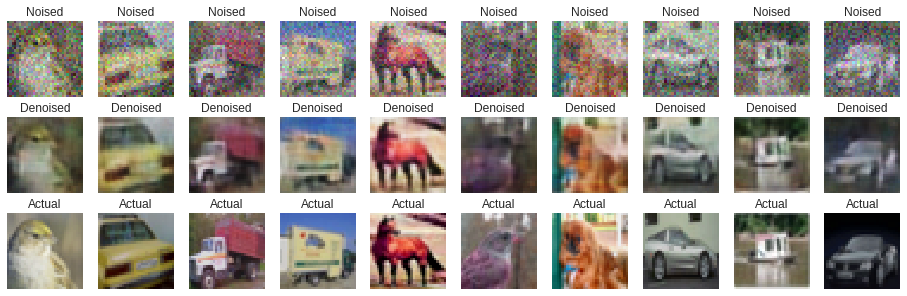


Epoch: 100 | Loss: 0.56440


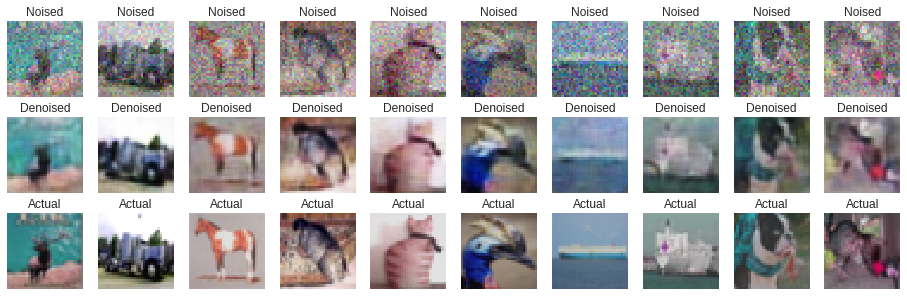

In [10]:
epochs = 100

for epoch in range(epochs):
    cum_loss = 0.0
    for features, labels in train_data:
        features = features.as_in_context(ctx)
        labels = labels.as_in_context(ctx)
        
        with autograd.record():
            outputs = model(features)
            loss = objective(outputs, labels)
        loss.backward()
        trainer.step(batch_size)
        cum_loss += loss.mean()
    
    print(f'\nEpoch: {epoch + 1} | Loss: {cum_loss.asscalar()/batches:.5f}')
    
    noised, denoised = next(test_iter)
    generated = model(noised[:10].as_in_context(ctx))
    plt.figure(figsize = (16, 5))
    for i, (noisy, denoisy, label) in enumerate(zip(noised[:10], generated, denoised[:10])):
        plt.subplot(3, 10, i + 1)
        plt.imshow(noisy.transpose((1, 2, 0)).asnumpy())
        plt.axis('off')
        plt.title('Noised')

        plt.subplot(3, 10, i + 11)
        plt.imshow(denoisy.transpose((1, 2, 0)).asnumpy())
        plt.axis('off')
        plt.title('Denoised')

        plt.subplot(3, 10, i + 21)
        plt.imshow(label.transpose((1, 2, 0)).asnumpy())
        plt.axis('off')
        plt.title('Actual')
    plt.show()

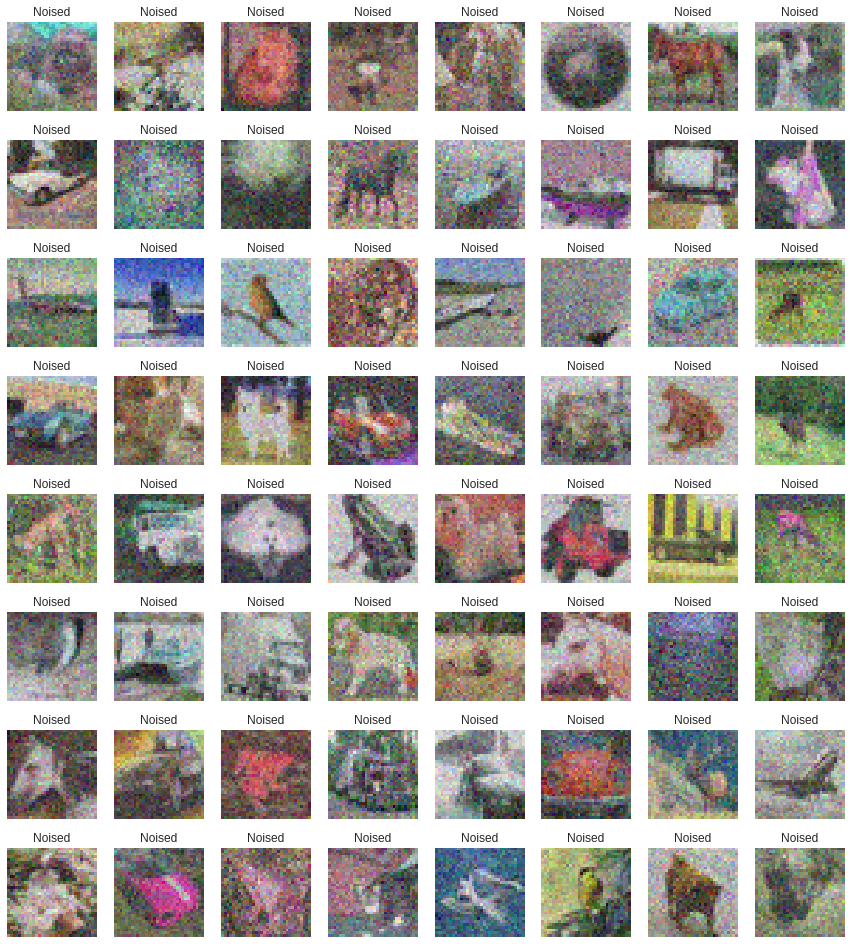

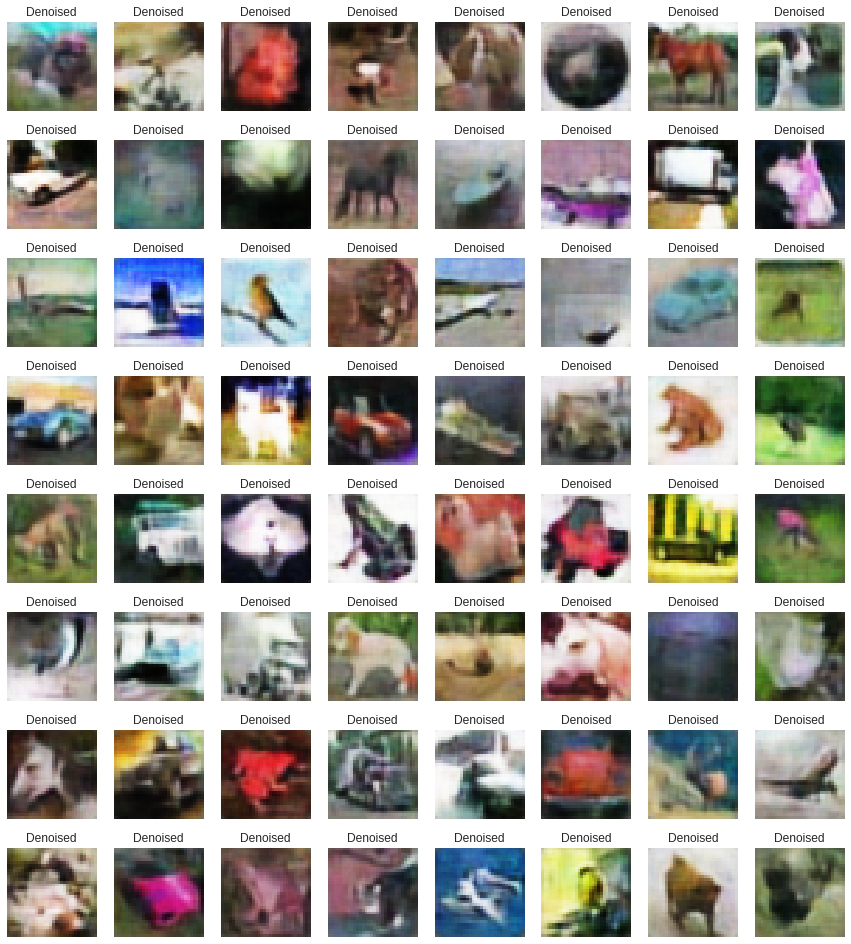

In [13]:
noised, _ = next(test_iter)
generated = model(noised.as_in_context(ctx))

plt.figure(figsize = (15, 17))
for i, noisy in enumerate(noised):
    plt.subplot(8, 8, i + 1)
    plt.imshow(noisy.transpose((1, 2, 0)).asnumpy())
    plt.axis('off')
    plt.title('Noised')
plt.show()

plt.figure(figsize = (15, 17))
for i, denoisy in enumerate(generated):
    plt.subplot(8, 8, i + 1)
    plt.imshow(denoisy.transpose((1, 2, 0)).asnumpy())
    plt.axis('off')
    plt.title('Denoised')
plt.show()